# Baseline

- use TQ1980 test area
- topo, highways, residences, stops (bus)

In [3]:
import os
import sys
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import collections

import mplleaflet
import matplotlib.pyplot as plt


import folium
import fiona
import pyproj
import shapely as shp
from rasterio._base import gdal_version
import rasterio as rio
#https://rasterio.readthedocs.io/en/latest/
import rasterio.warp
import rasterio.features
from rasterio import plot #essential to plot images in BNG, in correct position, and full RGB 

import cv2 #unable to read jp2, use skimage

#import contextily as ctx

In [4]:
%matplotlib inline
pd.set_option('display.max_column', 100) #set max number of cols to display before ...
#check which environment 
print(sys.executable)

/Users/tamsinforbes/anaconda3/bin/python


## Load data

- topo layers
- highways layer
- RGB APGB

### Topo layer - jigsaw vector polygons

In [5]:
#original Ealing gpkg and all layers
path = "../../../ECMM433_Project_1/data/OSTopographicLayerApril2020_Ealing.gpkg"

for layername in fiona.listlayers(path):
    with fiona.open(path, layer=layername) as src:
        print(layername, len(src))

BoundaryLine 9794
CartographicSymbol 12414
CartographicText 192435
TopographicArea 1457091
TopographicLine 4072454
TopographicPoint 30508


In [6]:
#just topo layer cropped to TQ1980 in QGIS
path = "../data/TopoArea/TQ1980.gpkg"

for layername in fiona.listlayers(path):
    with fiona.open(path, layer=layername) as src:
        print(layername, len(src))
src.close()
#ealing topo
et = gpd.read_file(path, layer = "eTopoArea_1980")

print(et.shape)

eTopoArea_1980 7200
(7200, 23)


### Highways layer - road centre lines

In [7]:
#ealing highways layer
path = "../data/ealing_highways/OSHighwaysNetworkApril2020_Ealing.gpkg"

for layername in fiona.listlayers(path):
    with fiona.open(path, layer=layername) as src:
        print(layername, len(src))
src.close()  
#get highways layer sections
eRoadLink = gpd.read_file(path, layer = "RoadLink")
eStructure = gpd.read_file(path, layer = "Structure")
eRoadNode = gpd.read_file(path, layer = "RoadNode")
eRestrictionForVehicles = gpd.read_file(path, layer = "RestrictionForVehicles")
eAccessRestriction = gpd.read_file(path, layer = "AccessRestriction")

#Nodes and Links as in network theory, nodes are where two or more links meet
#not sure what Structure is here

RoadLink 13507
Structure 1414
RoadNode 11017
RestrictionForVehicles 49
AccessRestriction 183


### Topo lines - line segment jigsaw edges

In [8]:
#just topo layer cropped to TQ1980 in QGIS
path = "../data/TopoLine/TQ1980.gpkg"

for layername in fiona.listlayers(path):
    with fiona.open(path, layer=layername) as src:
        print(layername, len(src))
src.close()
#ealing topo line
el = gpd.read_file(path, layer = "etopoLine_1980")

print(el.shape)

etopoLine_1980 19788
(19788, 28)


### Raster layer

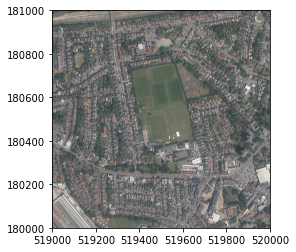

ColorInterp.red
ColorInterp.green
ColorInterp.blue
path:  ../data/APGB_25_RGB/TQ1980.tif 
mode:  r 
is closed?:  False 
band count:  3 
shape:  (4000, 4000) 
crs:  EPSG:27700 
bounds:  BoundingBox(left=519000.0, bottom=180000.0, right=520000.0, top=181000.0)
33 255


In [9]:
# TQ1980 RGB layer
path = "../data/APGB_25_RGB/TQ1980.tif"
src = rio.open(path)
rgb = src.read()
rgb_transform = src.transform
rio.plot.show(rgb, transform=rgb_transform)
#rio.plot.show(src.read(), transform=src.transform)

print(src.colorinterp[0])
print(src.colorinterp[1])
print(src.colorinterp[2])
print("path: ", src.name, "\nmode: ", src.mode, "\nis closed?: ", src.closed
      , "\nband count: ", src.count, "\nshape: ", src.shape, "\ncrs: ", src.crs
     , "\nbounds: ", src.bounds)
print(rgb.min(), rgb.max()) #appears to be values 0 to 255
#assign bounds
grid_bounds = src.bounds

src.close()

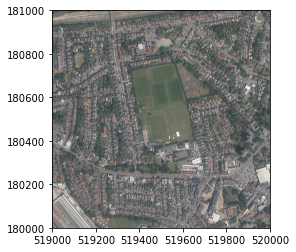

In [10]:
#alternatively plot from with statement
path = "../data/APGB_25_RGB/TQ1980.tif"
with rio.open(path) as src:
    rio.plot.show(src.read(), transform = src.transform)
    
src.close()

### NaPTAN - bus and other transport hub points
- the filters are incomplete
- best way to filter is spatially
- first read in csv and convert to gpkg
- use QGIS to select a subset of busstop points 

#NaPTAN data Ealing busstops only
#filteres in Excel - filters are incomplete
ebs = pd.read_csv("../data/NapTAN/StopsEaling.csv")
#create geometry from Easting and Northing, BNG 27700
ebs = gpd.GeoDataFrame(
    ebs, geometry = gpd.points_from_xy(ebs.Easting, ebs.Northing), crs="EPSG:27700")
print(ebs.geometry.name, ebs.crs)
#write as spatial file
ebs.to_file("../data/NapTAN/StopsEaling.gpkg", layer = "stops", driver="GPKG")
ebs.plot()

#NaPTAN data all busstops 
#something weird about the filters, not getting all 
#stops in the are
#read in whole lot and create gpkg
#read all cols as string except specified cols
bs = pd.read_csv(
    "../data/NapTAN/Stops.csv"
    , dtype = str
    , converters = {'Easting': np.int64, 'Northing': np.int64
    , 'Longitude': np.float64, 'Latitude': np.float64} )
#create geometry from Easting and Northing, BNG 27700
bs = gpd.GeoDataFrame(
    bs, geometry = gpd.points_from_xy(bs.Easting, bs.Northing), crs="EPSG:27700")
print(bs.geometry.name, bs.crs)
#write as spatial file
#bs.to_file("../data/NapTAN/Stops.gpkg", layer = "stops", driver="GPKG")
#bs.plot()

In [11]:
#In QGIS created StopsCut.gpkg which is a large area around TQ1980
path = "../data/NapTAN/StopsCut.gpkg"

for layername in fiona.listlayers(path):
    with fiona.open(path, layer=layername) as src:
        print(layername, len(src))
src.close()
#bus stops
bs = gpd.read_file(path, layer = "StopsCut")

print(bs.shape)

StopsCut 10765
(10765, 44)


## Explore data

(180000.0, 181000.0)

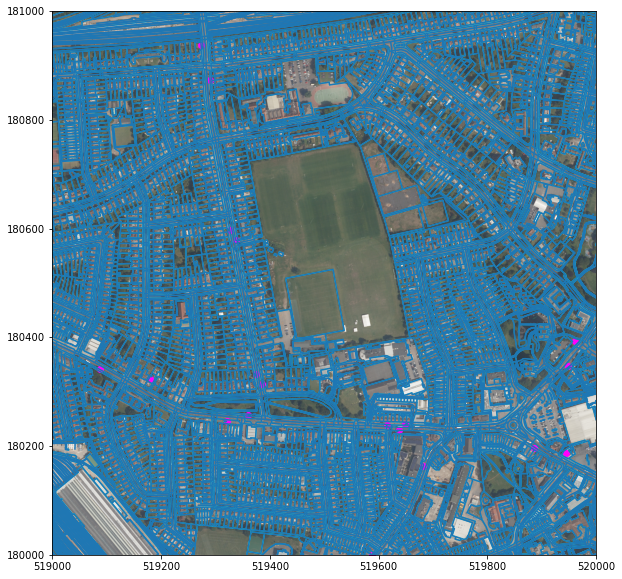

In [12]:
base = et.plot(figsize=(10,10), color="None", edgecolor="cyan", alpha=0.5)
rio.plot.show(rgb, transform=rgb_transform, ax=base) #uses rasterio plot module
eRoadLink.plot(ax=base)
el.plot(ax=base)
bs.plot(ax=base, color="magenta")
base.set_xlim(519000, 520000)
base.set_ylim(180000, 181000)

(180000.0, 180400.0)

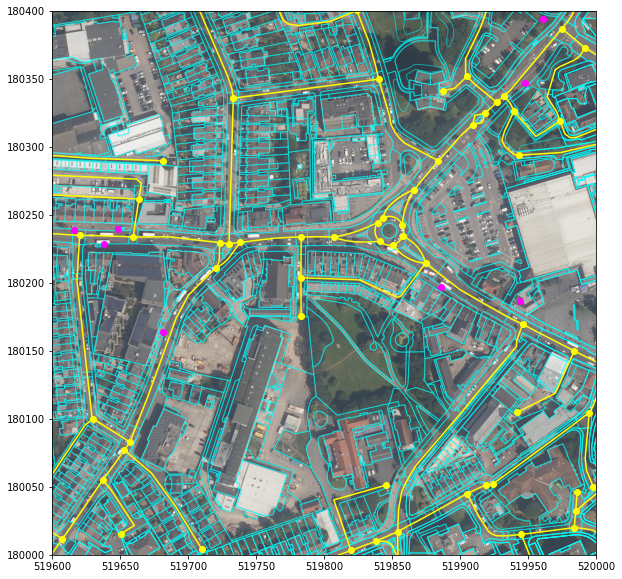

In [13]:
base = et.plot(figsize=(10,10), color="None", edgecolor="cyan", alpha=0.5)
rio.plot.show(rgb, transform=rgb_transform, ax = base) #uses rasterio plot module
eRoadLink.plot(ax=base, color="yellow")
eRoadNode.plot(ax=base, color="yellow")
bs.plot(ax=base, color="magenta")
base.set_xlim(519600, 520000)
base.set_ylim(180000, 180400)

(180000.0, 181000.0)

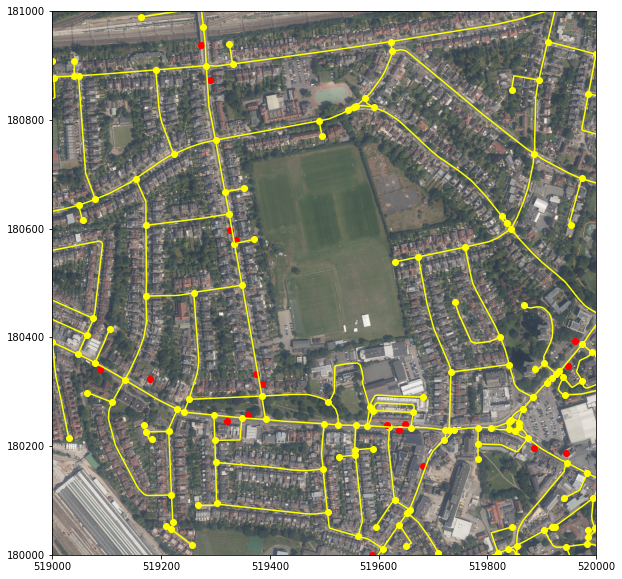

In [14]:
fig, ax = plt.subplots(figsize=(10,10))

rio.plot.show(rgb, transform=rgb_transform, ax=ax) #uses rasterio plot module
eRoadLink.plot(ax=ax, color="yellow")
eRoadNode.plot(ax=ax, color="yellow")
#eStructure.plot(ax=ax, color="limegreen")
#eRestrictionForVehicles.plot(ax=ax, color="magenta")
#eAccessRestriction.plot(ax=ax, color="orange")
bs.plot(ax=ax, color="red")
ax.set_xlim(519000, 520000)
ax.set_ylim(180000, 181000)

In [15]:
et.Theme.value_counts()

Land                                 3430
Buildings                            2916
Roads Tracks And Paths                785
Rail                                   40
Roads Tracks And Paths,Structures      14
Structures                              7
Land,Rail                               5
Rail,Structures                         2
Water                                   1
Name: Theme, dtype: int64

In [16]:
et.DescriptiveGroup.value_counts()

General Surface             3384
Building                    2916
Road Or Track                429
Roadside                     207
Path                         149
Rail                          40
Landform                      30
Natural Environment           13
Roadside,Structure            13
Structure                      7
Natural Environment,Rail       5
Unclassified                   3
Rail,Structure                 2
Road Or Track,Structure        1
Inland Water                   1
Name: DescriptiveGroup, dtype: int64

In [17]:
et.DescriptiveTerm.value_counts()

Multi Surface                                 2723
Traffic Calming                                 93
Slope                                           30
Electricity Sub Station                         16
Step                                            13
Scrub                                            6
Upper Level Of Communication                     5
Nonconiferous Trees                              5
Nonconiferous Trees,Scrub                        5
Tank                                             3
Bridge                                           3
Rail Signal Gantry                               2
Coniferous Trees,Nonconiferous Trees,Scrub       1
Scrub,Nonconiferous Trees                        1
Archway                                          1
Static Water                                     1
Name: DescriptiveTerm, dtype: int64

In [18]:
et.head()

,id,OBJECTID,TOID,FeatureCode,Version,VersionDate,Theme,ThemeCount,CalculatedAreaValue,ChangeDate,ReasonForChange,ChangeHistoryCount,DescriptiveGroup,DescriptiveGroupCount,DescriptiveTerm,DescriptiveTermCount,Make,PhysicalLevel,PhysicalPresence,broken,SHAPE_Length,SHAPE_Area,geometry
0,643242,643242,5000005125902538,10123,1,2014-05-29T00:00:00,Roads Tracks And Paths,1,44.669666,2014-04-29T00:00:00,New,1,Path,1,None,NaN,Manmade,50,None,false,32.838010,44.669666,"POLYGON ((519539.020 179987.631, 519545.071 17..."
1,643243,643243,1000001793846362,10056,2,2008-03-18T00:00:00,Land,1,66.485440,2006-12-06T00:00:00,New,1,General Surface,1,None,NaN,Natural,50,None,false,47.312817,66.485450,"POLYGON ((519561.040 179973.500, 519560.150 17..."
2,643244,643244,1000001793846365,10056,2,2008-03-18T00:00:00,Land,1,32.208200,2006-12-06T00:00:00,New,1,General Surface,1,None,NaN,Natural,50,None,false,34.586030,32.208200,"POLYGON ((519506.710 179985.100, 519507.260 17..."
3,643251,643251,1000001778929145,10056,4,2008-03-18T00:00:00,Land,1,14.644856,2006-12-06T00:00:00,New,1,General Surface,1,None,NaN,Natural,50,None,false,51.548592,14.644850,"POLYGON ((519513.020 180000.000, 519513.250 18..."
4,643252,643252,1000001778929144,10056,6,2014-05-29T00:00:00,Land,1,1152.839530,2014-04-29T00:00:00,Modified,3,General Surface,1,None,NaN,Manmade,50,None,false,299.453631,1152.839530,"POLYGON ((519512.340 180007.310, 519514.020 18..."


## Plot road sections

(180000.0, 181000.0)

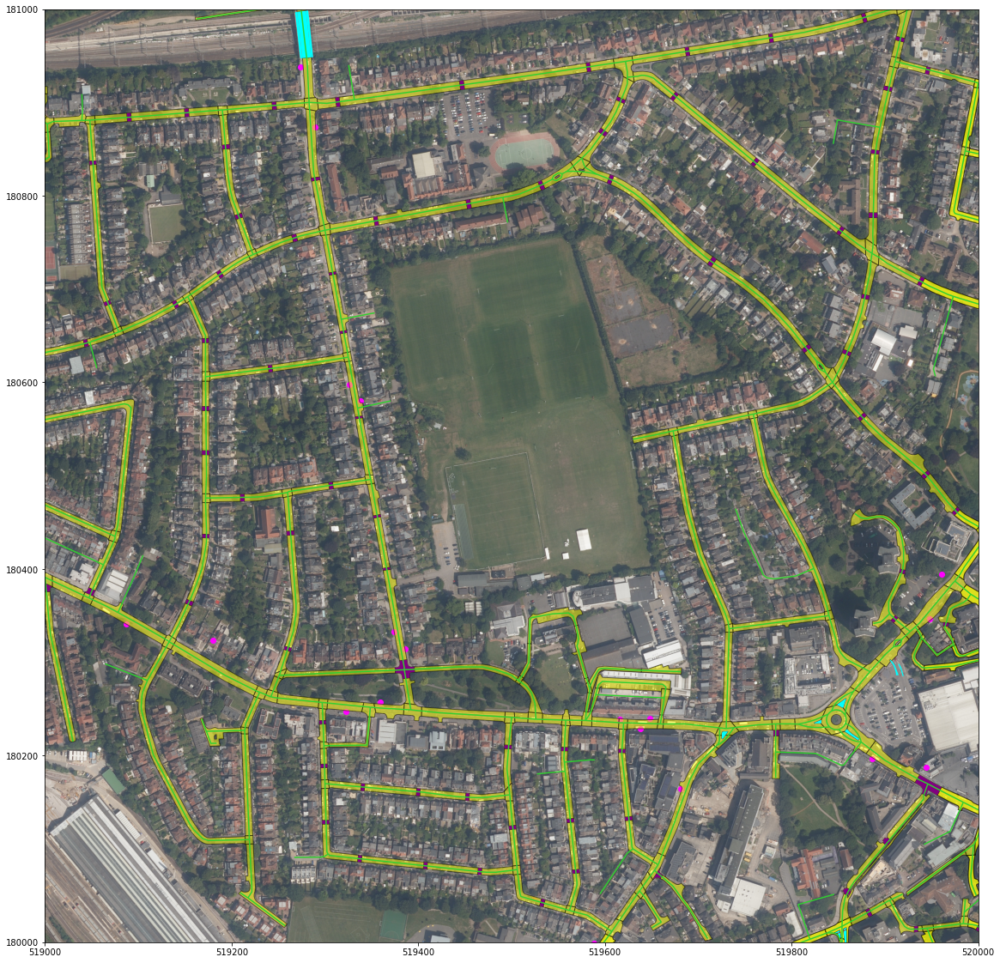

In [19]:
base = et.plot(figsize=(20,20), color="None", edgecolor="None", alpha=0.5)
rio.plot.show(rgb, transform=rgb_transform, ax = base) #uses rasterio plot module
eRoadLink.plot(ax=base, color="limegreen")
bs.plot(ax=base, color="magenta")
#add road sections etc
et[et.DescriptiveGroup == "Road Or Track"].plot(ax=base, color="yellow", edgecolor="black", alpha = 0.5)
et[et.DescriptiveTerm == "Traffic Calming"].plot(ax=base, color="purple")
et[et.Theme == "Roads Tracks And Paths,Structures"].plot(ax=base, color="cyan")
#base.set_xlim(519400, 520000)
#base.set_ylim(180000, 180600)

#TQ1980 sqkm
base.set_xlim(519000, 520000)
base.set_ylim(180000, 181000)


## Create some useful subsets of data

In [20]:
#rt: road topo (topo area just road or track)
rt = et[et.DescriptiveGroup == "Road Or Track"]

In [21]:
#got bounds of tif file with src.bounds
print(grid_bounds)
#use shp.geometry.box to convert to polygon
grid_poly = shp.geometry.box(*grid_bounds) #dunno what the * is for but fails without
#make into geodf
grid = gpd.GeoDataFrame([1], geometry=[grid_poly], crs="EPSG:27700")

BoundingBox(left=519000.0, bottom=180000.0, right=520000.0, top=181000.0)


<AxesSubplot:>

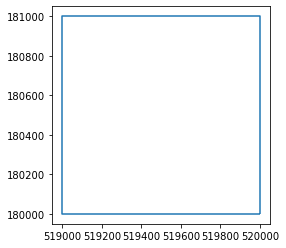

In [22]:
grid.boundary.plot()

In [23]:
#clip datasets to TQ1980 grid
rl_clip = gpd.clip(eRoadLink, grid) #road links
rn_clip = gpd.clip(eRoadNode, grid) #roadnodes
rt_clip = gpd.clip(rt, grid) #road & track topo (shapes)
bs_clip = gpd.clip(bs, grid) #bus stops

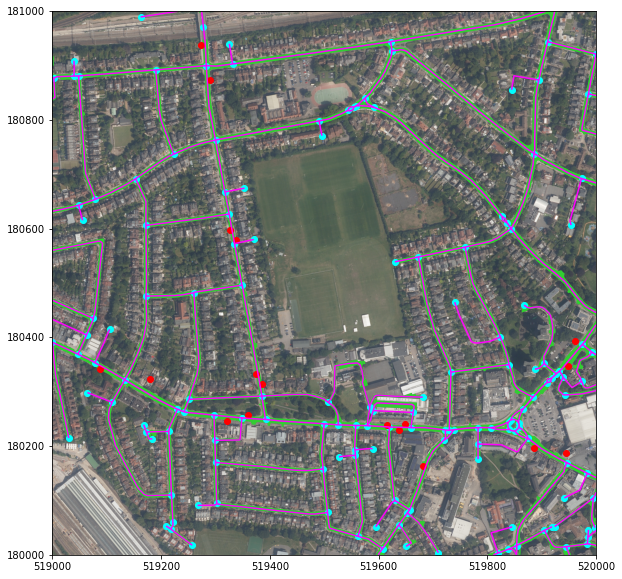

In [24]:
#plot
#base = rt_clip.boundary.plot(figsize=(10,10), color="limegreen")
fig, ax = plt.subplots(figsize=(10,10))
rt_clip.plot(ax=ax, color="limegreen", alpha=1, label="road&track")
rio.plot.show(rgb, transform=rgb_transform, ax=ax) #uses rasterio plot module
rl_clip.plot(ax=ax, color="magenta", label="roadlink")
rn_clip.plot(ax=ax, color="cyan", label='roadnode')
bs_clip.plot(ax=ax, color="red", label='bus stop')

#plt.legend()
plt.show()

# Baseline 1

- get total length of eRoadLinks in TQ1980
- double; thus assume parking on entire length and both sides
- divide by parking length; 5m
- this will be an overestimate

#### To do
- spatial intersection; between road and track polygons and roadlinks
- retain only those roadlinks that intersect with a road polygon

In [25]:
rl_clip.head()

,OBJECTID,TOID,identifier,identifierVersionId,beginLifespanVersion,fictitious,validFrom,reasonForChange,roadClassification,routeHierarchy,formOfWay,trunkRoad,primaryRoute,roadClassificationNumber,roadName1_Name,roadName2_Name,roadName1_Language,roadName2_Language,operationalState,provenance,directionality,length,matchStatus,alternateIdentifier1,alternateIdentifier2,alternateIdentifier3,alternateIdentifier4,alternateIdentifier5,startGradeSeparation,endGradeSeparation,roadStructure,cycleFacility,roadWidthMinimum,roadWidthAverage,elevationGainInDirection,elevationGainOppositeDirection,startNode,endNode,SHAPE_Length,geometry
13,74527,osgb4000000030134742,4000000030134742,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Single Carriageway,0,0,None,Twyford Crescent,,,,Open,OS Urban And OS Height,bothDirections,125.41,Matched,5270_519472180294,None,None,None,None,0,0,None,,5.3m,6.3m,0.8m,0m,osgb4000000030676574,osgb4000000029907153,125.416220,"LINESTRING Z (519507.223 180280.656 28.400, 51..."
41,75978,osgb4000000030215300,4000000030215300,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Minor Road,Single Carriageway,0,0,None,Creffield Road,,,,Open,OS Urban And OS Height,bothDirections,71.82,Matched,5270_519030180638,None,None,None,None,0,0,None,,7.2m,7.6m,0m,1.2m,osgb4000000029907096,osgb5000005125902694,71.821539,"LINESTRING Z (519000.000 180632.000 31.300, 51..."
42,75979,osgb4000000030215301,4000000030215301,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Minor Road,Single Carriageway,0,0,None,Creffield Road,,,,Open,OS Urban And OS Height,bothDirections,83.34,Matched,5270_519117180671,None,None,None,None,0,0,None,,7.5m,8m,0m,0.2m,osgb4000000029907090,osgb4000000029907097,83.341751,"LINESTRING Z (519079.000 180654.000 30.800, 51..."
132,80988,osgb4000000030453067,4000000030453067,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Traffic Island Link,0,0,None,Rosemont Road,,,,Open,OS Urban And OS Height,inOppositeDirection,17.13,Matched,5270_519716180728,None,None,None,None,0,0,None,,3.9m,7.1m,0m,0.2m,osgb4000000029907171,osgb4000000029907169,17.131347,"LINESTRING Z (519826.759 180622.899 27.400, 51..."
275,88835,osgb5000005125897827,5000005125897827,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,A Road,A Road,Single Carriageway,0,0,A4000,High Street,,,,Open,OS Urban And OS Height,bothDirections,8.25,Matched,5270_519756180232,None,None,None,None,0,0,None,,10m,12.7m,0m,0.3m,osgb4000000029905968,osgb5000005125897773,8.254484,"LINESTRING Z (519730.000 180229.000 26.800, 51..."


In [26]:
rl_clip.columns

Index(['OBJECTID', 'TOID', 'identifier', 'identifierVersionId',
       'beginLifespanVersion', 'fictitious', 'validFrom', 'reasonForChange',
       'roadClassification', 'routeHierarchy', 'formOfWay', 'trunkRoad',
       'primaryRoute', 'roadClassificationNumber', 'roadName1_Name',
       'roadName2_Name', 'roadName1_Language', 'roadName2_Language',
       'operationalState', 'provenance', 'directionality', 'length',
       'matchStatus', 'alternateIdentifier1', 'alternateIdentifier2',
       'alternateIdentifier3', 'alternateIdentifier4', 'alternateIdentifier5',
       'startGradeSeparation', 'endGradeSeparation', 'roadStructure',
       'cycleFacility', 'roadWidthMinimum', 'roadWidthAverage',
       'elevationGainInDirection', 'elevationGainOppositeDirection',
       'startNode', 'endNode', 'SHAPE_Length', 'geometry'],
      dtype='object')

In [27]:
rl_clip.shape

(213, 40)

In [28]:
rl_clip.describe()

,OBJECTID,fictitious,trunkRoad,primaryRoute,length,startGradeSeparation,endGradeSeparation,SHAPE_Length
count,2.130000e+02,213.0,213.0,213.0,213.000000,213.0,213.0,213.000000
mean,2.234346e+06,0.0,0.0,0.0,73.391925,0.0,0.0,73.394434
std,1.625140e+06,0.0,0.0,0.0,66.123001,0.0,0.0,66.123684
min,7.452700e+04,0.0,0.0,0.0,5.090000,0.0,0.0,5.085342
25%,9.748980e+05,0.0,0.0,0.0,27.960000,0.0,0.0,27.956229
50%,1.876119e+06,0.0,0.0,0.0,49.660000,0.0,0.0,49.660966
75%,3.960482e+06,0.0,0.0,0.0,93.410000,0.0,0.0,93.413971
max,5.130030e+06,0.0,0.0,0.0,349.760000,0.0,0.0,349.764215


In [29]:
#drop some cols, 
#SHAPE_Length is no longer correct
rl_clip = rl_clip[['OBJECTID', 'TOID', 'identifier','routeHierarchy', 'formOfWay', 'trunkRoad',
       'primaryRoute','directionality', 'roadWidthMinimum', 'roadWidthAverage',
       'startNode', 'endNode', 'geometry']]
#calculate length
rl_clip["length"] = rl_clip.geometry.length

rl_clip.head()

,OBJECTID,TOID,identifier,routeHierarchy,formOfWay,trunkRoad,primaryRoute,directionality,roadWidthMinimum,roadWidthAverage,startNode,endNode,geometry,length
13,74527,osgb4000000030134742,4000000030134742,Local Road,Single Carriageway,0,0,bothDirections,5.3m,6.3m,osgb4000000030676574,osgb4000000029907153,"LINESTRING Z (519507.223 180280.656 28.400, 51...",125.416220
41,75978,osgb4000000030215300,4000000030215300,Minor Road,Single Carriageway,0,0,bothDirections,7.2m,7.6m,osgb4000000029907096,osgb5000005125902694,"LINESTRING Z (519000.000 180632.000 31.300, 51...",49.257817
42,75979,osgb4000000030215301,4000000030215301,Minor Road,Single Carriageway,0,0,bothDirections,7.5m,8m,osgb4000000029907090,osgb4000000029907097,"LINESTRING Z (519079.000 180654.000 30.800, 51...",83.341751
132,80988,osgb4000000030453067,4000000030453067,Local Road,Traffic Island Link,0,0,inOppositeDirection,3.9m,7.1m,osgb4000000029907171,osgb4000000029907169,"LINESTRING Z (519826.759 180622.899 27.400, 51...",17.131347
275,88835,osgb5000005125897827,5000005125897827,A Road,Single Carriageway,0,0,bothDirections,10m,12.7m,osgb4000000029905968,osgb5000005125897773,"LINESTRING Z (519730.000 180229.000 26.800, 51...",8.254484


In [30]:
#total length
print("Total length of roads within grid is: ", sum(rl_clip.length)/1000, " km")

Total length of roads within grid is:  14.247889989560566  km


In [31]:
#total parking assuming parking on both sides and full length
#parking space length = 5m
print("Number of parking spaces (assuming parking both sides and full length): "
      , int(np.round(2*sum(rl_clip.length)/5)), " cars" )

Number of parking spaces (assuming parking both sides and full length):  5699  cars


In [32]:
#Number of households in grid, this is 1300; but maybe recalculate here

In [33]:
#can I exclude some road junctions using the routeHierarchy and formOfWay cols

In [34]:
eRoadLink.routeHierarchy.value_counts()

Local Road                          6692
Restricted Secondary Access Road    2047
Restricted Local Access Road        1208
Minor Road                          1080
A Road                              1028
Secondary Access Road                573
B Road                               509
A Road Primary                       281
Local Access Road                     89
Name: routeHierarchy, dtype: int64

In [35]:
rl_clip.routeHierarchy.value_counts().sort_index(ascending=True)

A Road                              52
Local Access Road                    3
Local Road                          95
Minor Road                          29
Restricted Local Access Road        20
Restricted Secondary Access Road    11
Secondary Access Road                3
Name: routeHierarchy, dtype: int64

<AxesSubplot:>

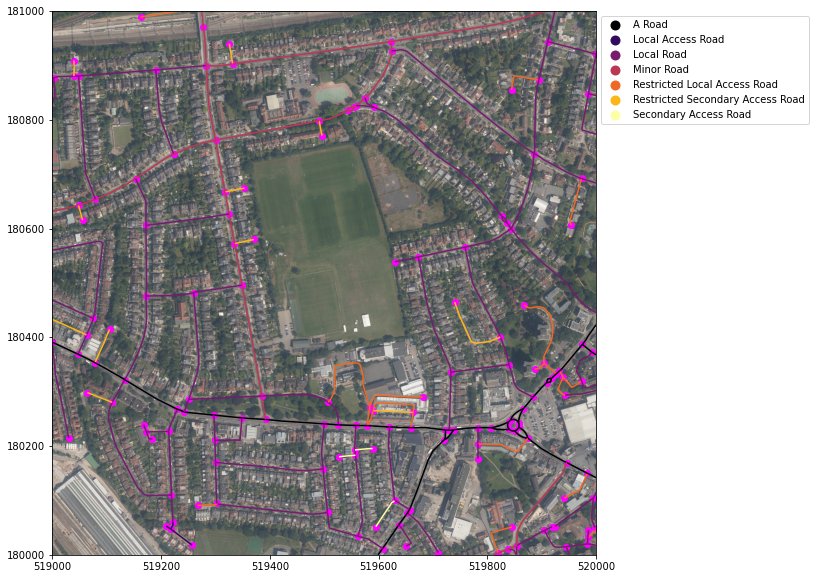

In [36]:
fig, ax = plt.subplots(figsize=(10,10))
rl_clip.plot(ax=ax, column = "routeHierarchy", cmap="inferno", legend=True)
leg = ax.get_legend() 
leg.set_bbox_to_anchor((1,1)) #adjust legend location
rio.plot.show(rgb, transform=rgb_transform, ax=ax) #uses rasterio plot module
rn_clip.plot(ax=ax, color="magenta")

In [37]:
eRoadLink.formOfWay.value_counts()

Single Carriageway                 11973
Traffic Island Link At Junction      532
Dual Carriageway                     392
Roundabout                           245
Traffic Island Link                  199
Slip Road                             96
Enclosed Traffic Area                 69
Shared Use Carriageway                 1
Name: formOfWay, dtype: int64

In [38]:
rl_clip.formOfWay.value_counts()

Single Carriageway                 190
Traffic Island Link At Junction     12
Roundabout                           6
Traffic Island Link                  4
Slip Road                            1
Name: formOfWay, dtype: int64

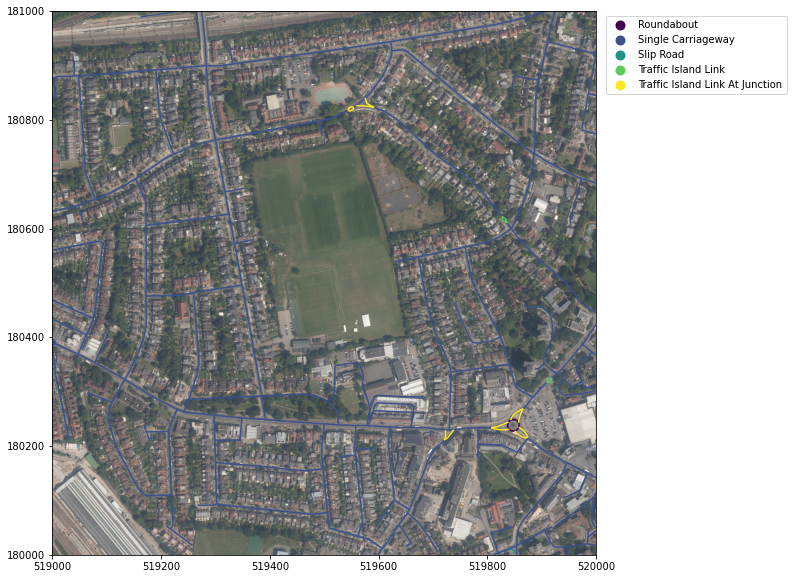

In [39]:
fig, ax = plt.subplots(figsize=(10,10))
rl_clip.plot(ax=ax,column="formOfWay", cmap="viridis", legend=True)
rio.plot.show(rgb, transform=rgb_transform, ax=ax) #uses rasterio plot module
leg = ax.get_legend() #adjust legend location
leg.set_bbox_to_anchor((1.01,1))

In [40]:
#determine which road can have parking both sides
#parking space standard is 2.4 by 4.8, so for double parking
#av road width must be >= 3* 2.4
#create new col parking_length
#rl["parking_length"] = 

In [41]:
#rl.head()

- determine which road links can have parking both sides, use 'roadWidthMinimum', 'roadWidthAverage'
- exclude intersections: identify intersections first! ML?

<AxesSubplot:>

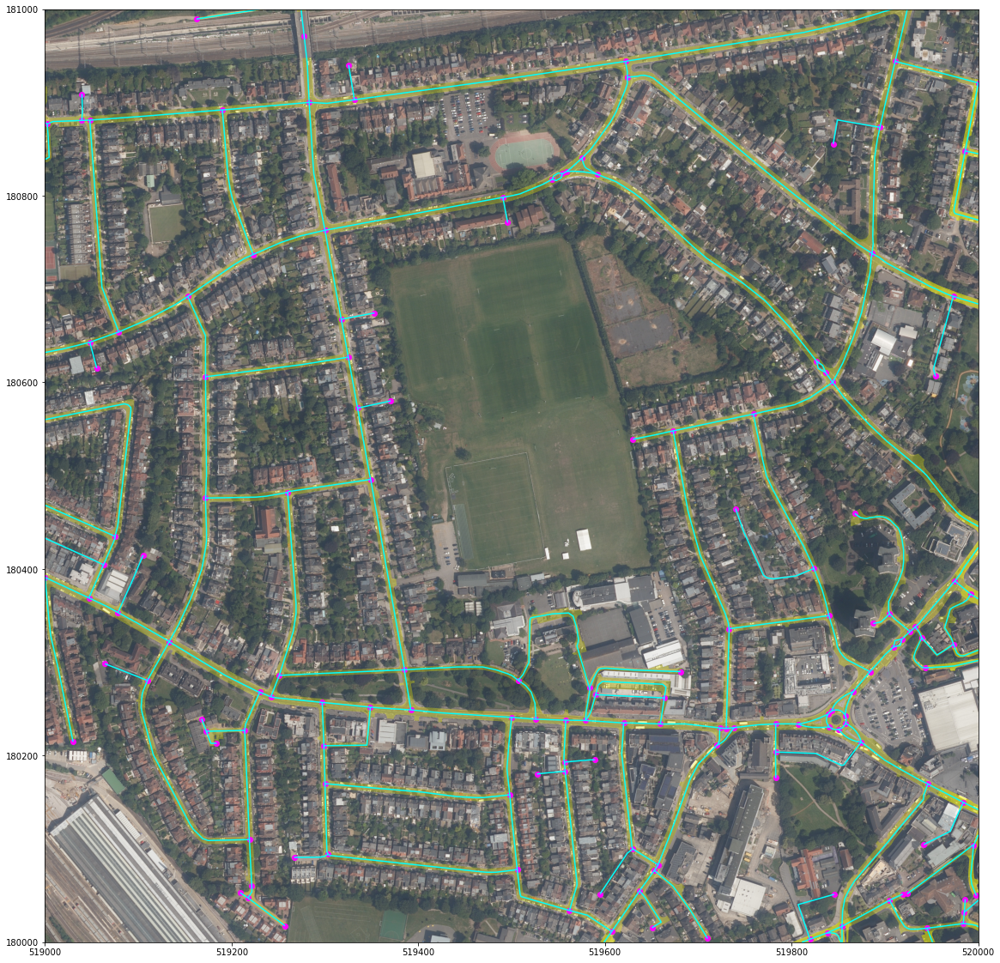

In [42]:
#plot to compare which shapes have nodes 
#and which are excluded by thresholding on area, perimeter or compactness
base = rt_clip.plot(figsize=(20,20), color="yellow", alpha=0.3)
rio.plot.show(rgb, transform=rgb_transform, ax = base) #uses rasterio plot module
rl_clip.plot(ax=base, color="cyan")
rn_clip.plot(ax=base, color="magenta")

### Roads in TQ1980 divided by parking space length

#### Feature engineering per road section TOID
Work towards dataframe with one row per road section TOID from TopoArea layer. For each roads section
- intersect with roadLink and get average roadWidthAverage (some road sections intersect with more that one roadLink.
- get sum of lengths of roadLinks, or parts thereof, that intersect - for intersections this will include the 

### MV idea
- node an link intersections are -o-, T or + shaped.
    - -o- can be parked either side, this is not a real intersection, maybe just a change in road name
    - T junctions can park on top side of T bar, unless it's too close to another intersection! Can't park on vertical
    - + shape can't park on any of it
- parts of road section perimeter that are roughly perpendicular to direction of road can't be parked on 
- parts of road section perimeter that are parallel to direction of road but are adjacent to another road ca not be parked on.
- so for each road section cut our RGB and also superimposed the roadlink and node info?

- the TOID/s of the road link that corresponds to it - this can be one to many, er or one to a fraction, (many to one :o( arse)
- RoadLink df has directionality, length (m), roadWidthMinimum, roadWidthAverage
- so for for a road section polygon I can intersect with roadLink get the roadWidthAverage (maybe taking average of multiple intersecting roadLinks), make the intersection road link line a single geom with the combined roadWidthAverage and calculate the length of the new geom Line. Will lose node info.




- want to include road humps as parkable, but not other traffic calming 
- examine road links, what are these made up of?
- intersect road link with toppo roads, roadlink appears to include private drives, which are off-street
- 

In [43]:
eRoadLink

,OBJECTID,TOID,identifier,identifierVersionId,beginLifespanVersion,fictitious,validFrom,reasonForChange,roadClassification,routeHierarchy,formOfWay,trunkRoad,primaryRoute,roadClassificationNumber,roadName1_Name,roadName2_Name,roadName1_Language,roadName2_Language,operationalState,provenance,directionality,length,matchStatus,alternateIdentifier1,alternateIdentifier2,alternateIdentifier3,alternateIdentifier4,alternateIdentifier5,startGradeSeparation,endGradeSeparation,roadStructure,cycleFacility,roadWidthMinimum,roadWidthAverage,elevationGainInDirection,elevationGainOppositeDirection,startNode,endNode,SHAPE_Length,geometry
0,73924,osgb4000000030095804,4000000030095804,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Single Carriageway,0,0,None,Melbury Avenue,,,,Open,OS Urban And OS Height,bothDirections,420.83,Matched,5270_513653179115,None,None,None,None,0,0,None,,4.7m,5.4m,0.2m,2.6m,osgb4000000029898371,osgb4000000029898283,420.834325,"LINESTRING Z (513734.225 179300.098 30.300, 51..."
1,73925,osgb4000000030095829,4000000030095829,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Single Carriageway,0,0,None,Ealing Park Gardens,,,,Open,OS Urban And OS Height,bothDirections,196.54,Matched,5270_517268178706,None,None,None,None,0,0,None,,6.6m,6.7m,0.1m,1.8m,osgb4000000029898750,osgb4000000030800010,196.535772,"LINESTRING Z (517150.000 178625.000 20.900, 51..."
2,73926,osgb4000000030095884,4000000030095884,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,B Road,B Road,Single Carriageway,0,0,B452,Argyle Road,,,,Open,OS Urban And OS Height,bothDirections,110.90,Matched,5270_516483181140,None,None,None,None,0,0,None,,9.3m,9.9m,1.8m,1m,osgb5000005140352940,osgb4000000029899804,110.896859,"LINESTRING Z (516485.390 181131.960 36.100, 51..."
3,73929,osgb4000000030096223,4000000030096223,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Single Carriageway,0,0,None,Rusthall Avenue,,,,Open,OS Urban And OS Height,bothDirections,273.39,Matched,5270_520798179212,None,None,None,None,0,0,None,,6.7m,7.3m,0.1m,1.1m,osgb4000000029906585,osgb4000000029906532,273.390401,"LINESTRING Z (520845.000 179337.000 8.100, 520..."
4,73930,osgb4000000030096291,4000000030096291,,2017-04-15T00:00:00,0,None,Modified Geometry And Attributes,Unclassified,Local Road,Single Carriageway,0,0,None,Second Avenue,,,,Open,OS Urban And OS Height,bothDirections,154.17,Matched,5270_521684180212,None,None,None,None,0,0,None,,7.1m,7.5m,0m,0.3m,osgb4000000029907667,osgb4000000030676500,154.175225,"LINESTRING Z (521674.000 180289.000 8.500, 521..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13502,5157106,osgb5000005262674922,5000005262674922,,2020-04-19T00:00:00,0,None,New,Unclassified,Local Road,Single Carriageway,0,0,None,Kingsley Avenue,,,,Open,OS Urban And OS Height,bothDirections,12.95,Matched,5270_516130181516,None,None,None,None,0,0,None,,7.1m,7.3m,0m,0.7m,osgb4000000029899797,osgb5000005262674378,12.950806,"LINESTRING Z (516132.000 181509.000 42.700, 51..."
13503,5158732,osgb5000005263050507,5000005263050507,,2020-04-19T00:00:00,0,None,New,Unclassified,Local Road,Single Carriageway,0,0,None,Beardsley Way,,,,Open,OS Urban And OS Height,bothDirections,35.64,Matched,5270_520725179872,None,None,None,None,0,0,None,,5.1m,10.8m,0m,0.8m,osgb5000005263050501,osgb4000000029906636,35.643247,"LINESTRING Z (520722.751 179889.009 10.400, 52..."
13504,5158733,osgb5000005263050511,5000005263050511,,2020-04-19T00:00:00,0,None,New,B Road,B Road,Single Carriageway,0,0,B490,Acton Lane,,,,Open,OS Urban And Interpolat,bothDirections,22.32,Matched,5270_520473179644,None,None,None,None,0,0,None,,,7m,0.5m,0.9m,osgb5000005139939007,osgb5000005263050499,22.319161,"LINESTRING Z (520466.737 179668.789 7.800, 520..."
13505,5160263,osgb5000005263277055,5000005263277055,

In [44]:
et[et.DescriptiveGroup == "Road Or Track"]

,id,OBJECTID,TOID,FeatureCode,Version,VersionDate,Theme,ThemeCount,CalculatedAreaValue,ChangeDate,ReasonForChange,ChangeHistoryCount,DescriptiveGroup,DescriptiveGroupCount,DescriptiveTerm,DescriptiveTermCount,Make,PhysicalLevel,PhysicalPresence,broken,SHAPE_Length,SHAPE_Area,geometry
81,644936,644936,1000001778708353,10172,8,2019-11-04T00:00:00,Roads Tracks And Paths,1,2336.992001,2019-11-01T00:00:00,Modified,6,Road Or Track,1,None,NaN,Manmade,50,None,false,635.783920,2336.992001,"POLYGON ((519555.860 179892.331, 519555.400 17..."
90,645075,645075,1000001778708420,10172,11,2016-08-29T00:00:00,Roads Tracks And Paths,1,958.588648,2016-08-26T00:00:00,Modified,8,Road Or Track,1,None,NaN,Manmade,50,None,false,255.622394,958.588648,"POLYGON ((519609.450 180000.000, 519603.414 17..."
123,646597,646597,1000001793586590,10172,5,2015-01-15T00:00:00,Roads Tracks And Paths,1,518.542992,2015-01-11T00:00:00,Restructured,5,Road Or Track,1,None,NaN,Manmade,50,None,false,182.779938,518.542598,"POLYGON ((519883.550 179910.250, 519883.600 17..."
129,646605,646605,1000001778708381,10172,6,2008-03-18T00:00:00,Roads Tracks And Paths,1,277.037376,2005-04-20T00:00:00,Attributes,4,Road Or Track,1,None,NaN,Manmade,50,None,false,89.828951,277.037350,"POLYGON ((519942.300 180010.200, 519941.750 18..."
215,648395,648395,1000001778708435,10172,11,2020-01-31T00:00:00,Roads Tracks And Paths,1,342.741414,2020-01-31T00:00:00,Restructured,8,Road Or Track,1,None,NaN,Manmade,50,None,false,168.808839,342.740293,"POLYGON ((519852.900 180004.900, 519850.740 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7135,1306870,1306870,1000001786701681,10172,4,2014-12-10T00:00:00,Roads Tracks And Paths,1,1428.646488,2014-12-09T00:00:00,Modified,3,Road Or Track,1,None,NaN,Manmade,50,None,false,390.947743,1428.646488,"POLYGON ((520031.050 180986.600, 520147.950 18..."
7143,1306903,1306903,1000001786701552,10172,3,2008-03-19T00:00:00,Roads Tracks And Paths,1,74.750536,2005-04-21T00:00:00,Attributes,2,Road Or Track,1,None,NaN,Manmade,50,None,false,34.651279,74.750550,"POLYGON ((520018.110 180912.850, 520009.640 18..."
7144,1306907,1306907,1000001786701558,10172,3,2008-03-19T00:00:00,Roads Tracks And Paths,1,432.314000,2005-03-31T00:00:00,Modified,2,Road Or Track,1,None,NaN,Manmade,50,None,false,134.571950,432.314000,"POLYGON ((520019.830 180980.120, 520028.050 18..."
7149,1306919,1306919,5000005138039042,10172,1,2014-12-10T00:00:00,Roads Tracks And Paths,1,45.363100,2014-12-09T00:00:00,New,1,Road Or Track,1,None,NaN,Manmade,50,None,false,28.901671,45.363100,"POLYGON ((520008.250 180922.700, 520008.800 18..."


# Identify road intersections by road node

- create a list of TOIDs that are the road intersections
- these are the shapes that contain a rode node

In [45]:
#join areas to nodes, drop rows with null area
#j1 contain node point geometry, and corresponding shape info, but not the polygons
j1 = gpd.sjoin(eRoadNode, rt, how="inner", op="within")

In [46]:
print(rt.shape, eRoadNode.shape, j1.shape)
#some road junctions contain multiple nodes; eg roundadbouts
#Morrison's roundabout has 6 nodes, 3 roads come into roundabout and each split in 2 
#to go around road furniture

(429, 23) (11017, 16) (189, 39)


In [47]:
#list of area TOIDs that cointain a road node; are therefore are road junctions: rj
rj_list = list(j1.TOID_right.drop_duplicates())
len(rj_list)

138

#### Compactness measure: isoperimetric inequality 
$4\pi A \leq L^2$ where $A$ is area of shape and $L$ is its perimeter length. equality holds only if shape is a circle.

The corresponding compactness quotient $Q = \frac{4\pi A}{L^2} \in [0,1]$ where values close to $1$ are more compact and closer in shape to a circle and values close to $0$ are less compact.

In [48]:
np.pi

3.141592653589793

In [49]:
#create df of just thr rj_list toids
rj = rt.copy(deep=True)
rj = rj[rj.TOID.isin(rj_list)]
#create compactness score 4*pi*A / L^2
rj["compact_q"] = (4 * np.pi * rj["SHAPE_Area"]) / rj["SHAPE_Length"]**2

<AxesSubplot:>

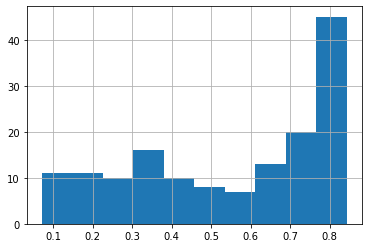

In [50]:
#hist of compactness
rj.compact_q.hist()

In [52]:
len(rj.compact_q)

151

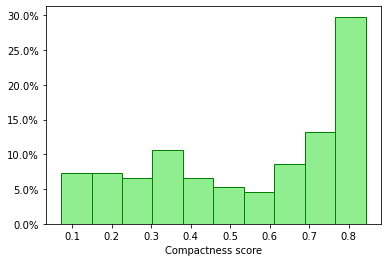

In [57]:
from matplotlib.ticker import PercentFormatter
plt.hist(rj.compact_q, weights=np.ones(len(rj.compact_q))/len(rj.compact_q), edgecolor='green', color='lightgreen')
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.xlabel("Compactness score")
plt.show()

<AxesSubplot:>

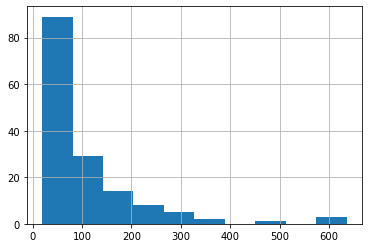

In [49]:
#histograms of rj shape length (perimeter
rj.SHAPE_Length.hist()

<AxesSubplot:>

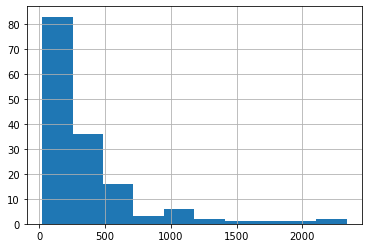

In [50]:
#histograms of rj shape  area
rj.SHAPE_Area.hist()

In [2]:
#histograms of rj shape  area
rj.SHAPE_Area.hist()

NameError: name 'rj' is not defined

(180000.0, 181000.0)

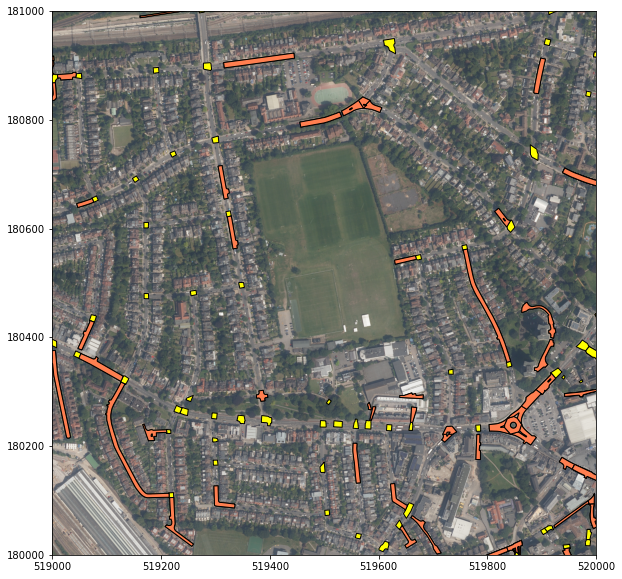

In [56]:
#plot to compare which shapes have nodes 
#and which are excluded by thresholding on area, perimeter or compactness
base = et.plot(figsize=(10,10), color="None", edgecolor="None", alpha=0.5)
rio.plot.show(rgb, transform=rgb_transform, ax = base) #uses rasterio plot module
rj.plot(ax=base, color="yellow", edgecolor="black", alpha = 1)
#j1.plot(ax=base, color="cyan")

#threshold options; colour excluded shapes
#rj[(rj.SHAPE_Area > 500)].plot(ax=base, color="magenta", alpha = 0.5)
#rj[(rj.SHAPE_Length > 200)].plot(ax=base, color="limegreen", alpha = 0.5)
rj[(rj.compact_q < 0.6)].plot(ax=base, color="coral", edgecolor="black", alpha = 1)

#TQ1980 sqkm
base.set_xlim(519000, 520000)
base.set_ylim(180000, 181000)

In [ ]:
# could join road link and use road link length to exclude longer bit of road

In [ ]:
j1
#point TOID 4000000029907098
#area TOID 1000001778685548

# 
- count parking by 2 * length of node
- depending on road width

In [ ]:
base = et.plot(figsize=(20,20), color="None", edgecolor="None", alpha=0.5)
rio.plot.show(rgb, transform=rgb_transform, ax = base) #uses rasterio plot module
rt.plot(ax=base, color="yellow", edgecolor="black", alpha = 0.5)
eRoadLink.plot(ax=base, color="cyan")
eRoadNode.plot(ax=base, color="cyan")
#TQ1980 sqkm
base.set_xlim(519000, 520000)
base.set_ylim(180000, 181000)

# Plan

- plot images with different road bits coloured, to see where, what they are
- look at shapes etc in QGIS - it is optimised for viewing spatial data
- decide how to measure lengths
- plot highways layer too? these are just the mid-line of the roads, easier to measure length, 
- filter the topo layer and then intersect with the highways layer to get just the bits of high ways and get lengths
- need to be able to double where parking is possible on both sides
- consider individual residence based approach
    - each house has a radius within which someone is prepared to park and walk home
    - take each radius and measure the available road lengths for parking, divide by car length, 
    - calculate density of cars in area; estimate by house size, or get figures for vehicles registered to addresses (only got these for low res though, only to first part of postcode)
    - could simply divide by number of other house radii that overlap to give density per household?

# ARCHIVE

In [ ]:
#filter eRoadLink for only those links that intersect with shapes in rt
#they all intersect as the edges touch 
rl = gpd.sjoin(eRoadLink, rt, how="inner", op="intersects")
base rl.plot()
rl.head()

In [ ]:
el1 = eRoadLink.head(5)
el1["colour"] = ["magenta", "cyan", "black", "yellow", "limegreen"]

base = eRoadLink.plot(figsize=(20,20), color="grey",alpha=0.5)
el1.plot(color=el1["colour"], ax=base)

In [ ]:
print(src.indexes)
source_colorinterp = collections.OrderedDict(zip(src.colorinterp, src.indexes))
source_colorinterp


In [ ]:
# TQ1980 RGB layer
path = "../data/APGB_25_RGB/TQ1980.tif"
src = rio.open(path)
rgb = src.read()

rio.plot.show(src, title="wrong colours, right spatial") 
rio.plot.show(rgb, title="right colours, lost spatial") 
